In [1]:
import scanpy as sc
import numpy as np
import sctm
import squidpy as sq
import sklearn

%load_ext autoreload
%autoreload 2

/home/chengwei/miniconda3/envs/torch/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In this tutorial, we demonstrate how to analyse multiple tissue slices in horizontal integration. Here we take mouse anterior and posterior brain as example. ST data were downloaded from https://www.10xgenomics.com/. The two slices are aligned for visual purposes

The prepocessed data can be accessible and downloaded via https://drive.google.com/drive/folders/1jDmx8IjiGhOD__spuuhFB1fWVDJtv5CU.

In [2]:
adata = sc.read_h5ad("../../../../spatialLDA/spatiallda/reproducibility/figure1/data/Mouse_Brain_Merge_Anterior_Posterior_Section_2/filtered_feature_bc_matrix.h5ad")
adata.var_names_make_unique()

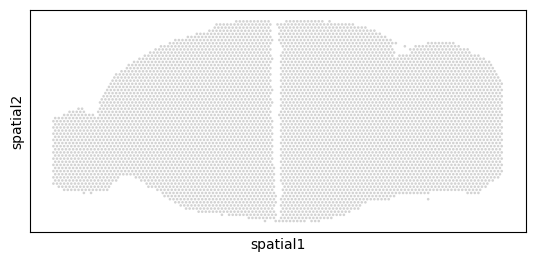

In [3]:
sc.pl.spatial(adata, spot_size = 100)

In [4]:
sc.pp.filter_cells(adata, min_genes=50)
sctm.pp.filter_genes(adata, 0.03,  expression_cutoff_99q = 1)
sc.pp.highly_variable_genes(adata, n_top_genes=6000, flavor="seurat_v3", batch_key = 'data')

In [5]:
sq.gr.spatial_neighbors(adata, library_key = "data")

In [32]:
n_topics = 30
# Only hvgs and fit a total of 30 topics here
# 
model = sctm.stamp.STAMP(
    adata[:, adata.var.highly_variable],
    n_topics = n_topics,
    categorical_covariate_keys = ['data'],
)

# uses gpu by default to use cpu use device="cpu"
model.train(weight_decay = 0.01)

Computing background frequencies


Loss:5888.478:  43%|████▎     | 429/1000 [07:28<09:57,  1.05s/it]

Early Stopping


In [33]:
topic_prop = model.get_cell_by_topic()
beta = model.get_feature_by_topic()
for i in topic_prop.columns:
    adata.obs[i] =  topic_prop[i]

In [34]:
top_genes = []
for i in topic_prop.columns:
    top_genes += beta.nlargest(1, i).index.tolist()

In [35]:
model.get_metrics()

{'Topic Coherence': 0.2653426930973011,
 'Topic Diversity': 0.88,
 'Gene Topic Coherence': 0.2551747497394177}

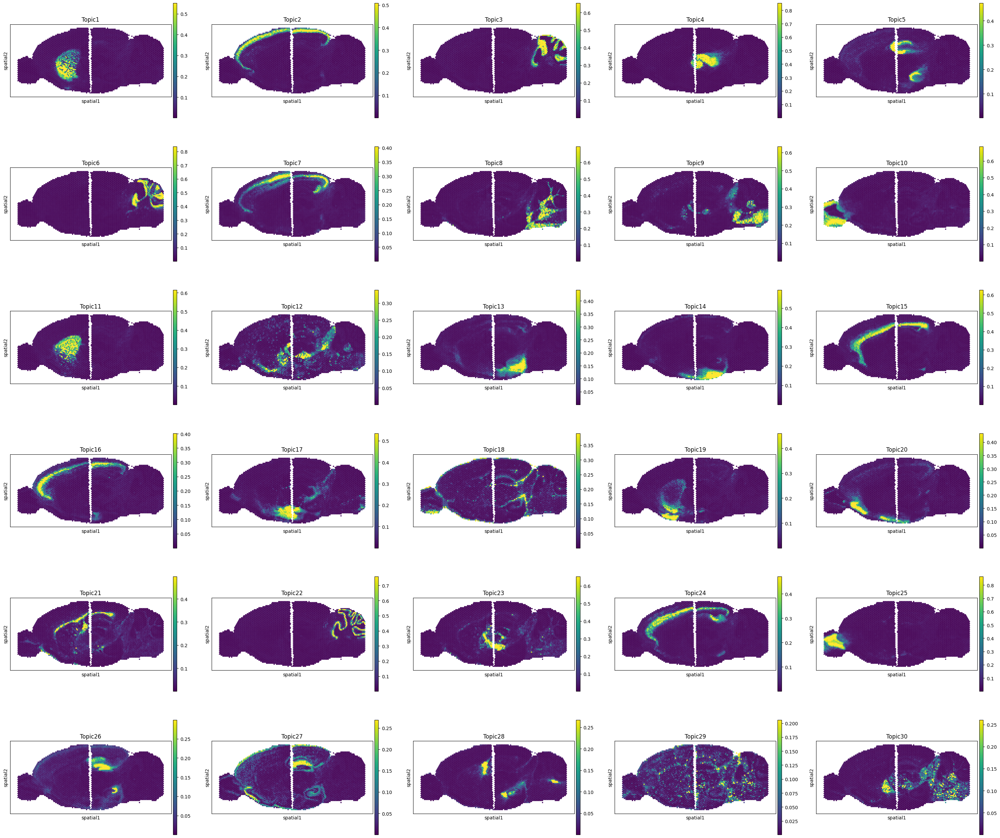

In [36]:
sc.pl.spatial(adata, color = topic_prop.columns, ncols = 5, spot_size = 150, vmax ='p99')

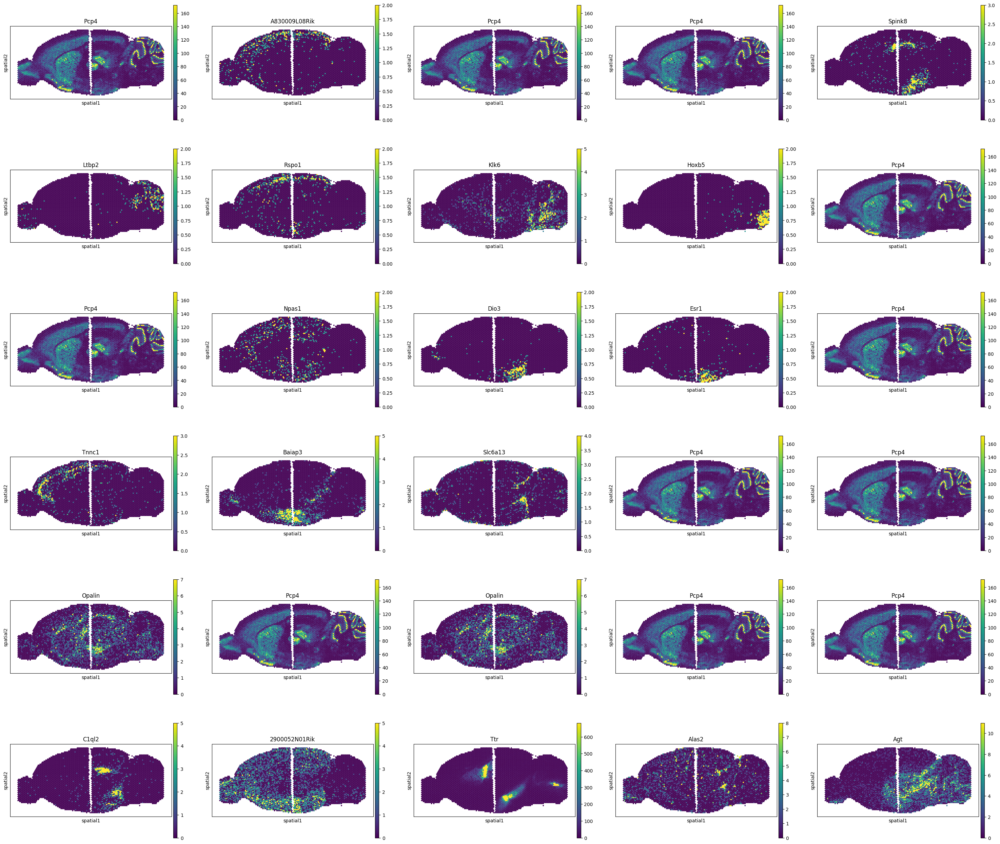

In [37]:
sc.pl.spatial(adata, color = top_genes, ncols = 5, spot_size = 150, vmax ='p99')

Plot out the different layers

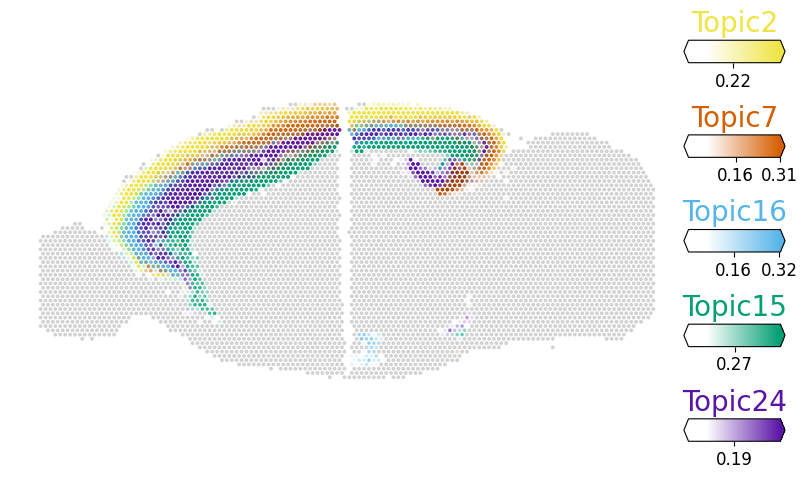

In [39]:
topics = ["Topic2", "Topic7", "Topic16", "Topic15", "Topic24"]
fig = sctm.pl.plot_spatial(adata, topic_prop.loc[:, topics], spot_size = 7,  display_zeros = True, axis_y_flipped = True)